Wettest MSAs by Population
=====================
This notebook sorts all metropolitan statistical areas (MSAs) in the United States by wettest population during May of 2015.  The population wetness of an MSA is calculated as the number of people in the MSA times the amount of rain received.  For the purposes of this exercise, assume that all people remain inside between the hours of 12 AM and 7 AM local time and so rainfall during these hours does not count.

## Data Sources
1. <b>201505precip.txt</b> -- Hourly precipitation totals for weather stations (WBANs) in the month of May 2017  
2. <b>201505stations.txt</b> -- Geo coordinates for each WBAN
3. <b>CPH-T-5.xls</b> -- Listing of MSAs and their populations
4. <b>cb_2015_us_cbsa_500k.shp</b> -- Shapefile containing the geographical boundaries of each MSA.
   
## General Strategy
The ```2015precip.txt``` file gives us the hourly precipitation totals for for each weather station (WBANs).  The first step is to load the hourly precipitation data, filter out the blank precipitation values, filter out values between 12:00am and 7:00am and total them for each WBAN.

Next we need to find the locations for each WBAN. ```2015stations.txt``` does that for us with longitutde and latitude coordinates so we join that with our WBAN precipation totals. 

The next step is to figure out in which MSAs the WBANs belong.  The U.S. Census Bureau provides mapping data with geographical boundaries for the MSAs in the form of shapefiles.  We join the WBAN precipitation totals that contain our geo coordinates with the shapefile metadata to get our MSAs.  There may be several WBANs within an MSA so we need to take the mean precipitation total for all the WBANs in a particualr MSA.

The last step is to add the population data in order to perform our wettest population calculation.  The file ```CPH-T-5.xls``` contains a list of MSA names and their populations according to the 2010 census.  We do a join on MSA name with our precipation totals and add a wetness to score.

## Technologies Used.
The choice of programming language and libraries boils to down to what is the right tool for the job.  Typically in a data analysis exercise such as this 75% of the work is data preperation.  You need to explore the data, figure out the format, look for bogus values and ensure data integrity.  Heavily typed languages such as Java can sometimes make this difficult at first as you may not have all the type information.  A language such as Python which is used frequently in the data analytics space would be a very good choice.

The data is not big enough to warrant a big data stack such has Apache Spark or other Hadoop based technologies.  Python has a library ideally suited for this analysis called [Pandas](http://pandas.pydata.org/pandas-docs/stable/).  Pandas contains a data structure called a DataFrame which we will make use of here.

Jupyter Notebooks are an ideal way to performa an analysis such as this.  They allow the developer to present their findings with tools such as markdown and the ability to display graphs, maps and arbitrary HTML.

## Import Modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# allow us to display matplotlib graphs inline.
%matplotlib inline

## Explore The Data.
We can see the data is a comma separated csv and it also contains a header row. A lot of blank precipitation values in ```201505precip.txt```.

In [2]:
!wc -l ./data/201505precip.txt
!head -n 5 ./data/201505precip.txt

1717153 ./data/201505precip.txt
Wban,YearMonthDay,Hour,Precipitation,PrecipitationFlag
00102,20150501,01, , 
00102,20150501,02, , 
00102,20150501,03, , 
00102,20150501,04, , 


In [3]:
#station column headers.
!head -n 1 ./data/201505station.txt

WBAN|WMO|CallSign|ClimateDivisionCode|ClimateDivisionStateCode|ClimateDivisionStationCode|Name|State|Location|Latitude|Longitude|GroundHeight|StationHeight|Barometer|TimeZone


## Load the hourly precipitation data.
From examining the file we see blank values are represented with a blank or ```"  T"``` so we can make sure those are recognized as null values in our dataframe.  This allows us to remove blank rows easily.  We then remove the nulls and filter out values between midnight and 7am.

In [2]:
#read the csv file into a DataFrame.
hourly_raw = pd.read_csv(
    './data/201505precip.txt', 
    usecols=[0,1,2,3],
    na_values={'Precipitation': [' ', '  T']}
)

#rename the Wban column to match the station data.
hourly_raw.rename(columns={'Wban': 'WBAN', 'Precipitation': 'Precip'}, inplace=True)

#get rid of rows that have null values.  This will shrink the size of our DataFrame.
hourly_trimmed = hourly_raw.dropna(axis=0, how='any')

#get rid of precip values between midight and 7am.
hourly_clean = hourly_trimmed[
    (hourly_trimmed['Hour'] >= 7) & 
    (hourly_trimmed['Hour'] <= 23)]

#verify the data is loaded
hourly_clean.head(5)

,WBAN,YearMonthDay,Hour,Precip
1078,103,20150514,23,0.01
1110,103,20150516,7,0.04
1111,103,20150516,8,0.02
1112,103,20150516,9,0.04
1113,103,20150516,10,0.01


In [3]:
#before and after removing null rows and filtering nightime hours.
(hourly_raw.shape, hourly_trimmed.shape, hourly_clean.shape)

((1717152, 4), (88690, 4), (63156, 4))

## Check the data types.
The Precip column is correctly loaded as a float numeric.  If there were bogus values in their pandas would have made that column an ```object``` type. 

In [4]:
#examine the type information.
hourly_clean.dtypes

WBAN              int64
YearMonthDay      int64
Hour              int64
Precip          float64
dtype: object

## Sum the precipitation values
Groupby WBAN sum up the Precip values for each.  We can use matplotlib to take a look our weather station totals.  We can see WBAN 325 and WBAN 13807 have signifigant rain fall totals.

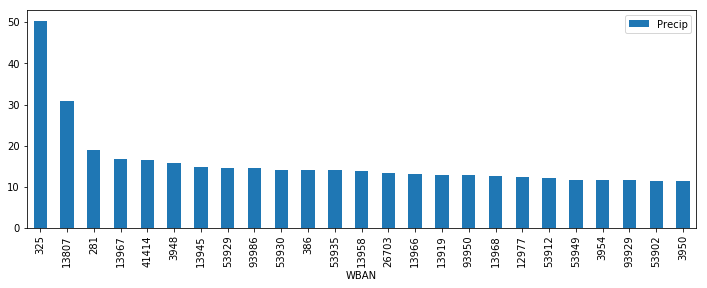

In [5]:
#sum for each WBAN
totals_df = hourly_clean.groupby('WBAN').agg({'Precip': 'sum'})

#display the results so far.
(totals_df
    .sort_values('Precip', ascending=False)
    .head(25)
    .plot(kind='bar', figsize=(12,4)))

We can see below that station 325 five has very high precip totals May 25th.

In [6]:
hourly_clean[hourly_clean.WBAN == 325].sort_values('Precip', ascending=False).head(10)

,WBAN,YearMonthDay,Hour,Precip
153113,325,20150525,18,7.99
152745,325,20150510,10,4.83
153112,325,20150525,17,4.29
152888,325,20150516,9,3.60
153252,325,20150531,13,3.30
153129,325,20150526,10,2.88
152529,325,20150501,10,2.78
153128,325,20150526,9,2.47
152528,325,20150501,9,2.10
152792,325,20150512,9,1.42


## Load the station data.
Join with the WBAN totals DataFrame.

In [13]:
#create the station data DataFrame.  Make sure we load only the relevant columns.
stations_df = pd.read_csv('./data/201505station.txt', 
                          sep='|',
                          usecols=['WBAN', 'Latitude', 'Longitude', 'Location'])

#join the totals DataFrame.
stations_hourly = totals_df.join(stations_df.set_index('WBAN')).reset_index()

#display the new DataFrame.
stations_hourly.sort_values('Precip', ascending=False).head(5)

,WBAN,Precip,Location,Latitude,Longitude
138,325,50.34,QUINCY MUNICIPAL AIRPORT,30.59800,-84.55700
718,13807,30.93,GODMAN AAF AIRPORT,37.90000,-85.96667
108,281,18.98,ROLLA MUNICIPAL AIRPORT,48.88400,-99.62100
794,13967,16.86,WILL ROGERS WORLD AIRPORT,35.38890,-97.60060
1257,41414,16.57,ANDERSEN AFB AIRPORT,13.58333,144.91667


## Load MSA Geographical Data.
There is another library for loading geo data into a DataFrame called ```geopandas```. Using geopandas we can do a geo spatial join from our previous DataFrame.

The first thing we need to do is convert the stations_hourly DataFrame to a ```GeoDataFrame```.  This is done by simply converting the Latitude and Longitude columns to a ```Point``` object.

Next we load the shapefile file provided by the census bureau and perform the spatial join.  The resulting DataFrame will have the weather station precipitation totals along with the MSA where that station is located.

In [16]:
#import the geopandas module and the shapely module.
from geopandas import GeoSeries, GeoDataFrame, read_file, sjoin
from shapely.geometry import Point

#create a list of Point objects.  
#zip operates on 2 lists yielding paired values. 
#use python's list comprehension to build a list of Points.
geometry = [Point(xy) for xy in zip(stations_hourly.Longitude, stations_hourly.Latitude)]

#Convert to GeoDataFrame.
geo_df = GeoDataFrame(stations_hourly, crs={'init': 'epsg:4269'}, geometry=geometry)

#Load the shapefile as a GeoDataFrame.
shape_df = read_file('./data/shape/cb_2015_us_cbsa_500k.shp')

#The shapefile meta data contains both metropolitan (M1) and micropolitan data (M2).  
#We only care about metropolitan areas.
shape_df = shape_df.loc[shape_df['LSAD'] == 'M1']

#drop unused columns
shape_df.drop(['ALAND','AWATER','CBSAFP','CSAFP','LSAD','AFFGEOID','GEOID'], axis=1, inplace=True)

#do the spaital join.  
#This will join rows where the Point is contained 
#in the Polygon defined in shape DataFrame.
msa_df = sjoin(geo_df, shape_df, how="inner", op='within').drop('index_right',axis=1)

#sort on Precip and display
msa_df.sort_values('Precip',ascending=False).head(5).set_index('WBAN')

,Precip,Location,Latitude,Longitude,geometry,NAME
WBAN,,,,,,
325,50.34,QUINCY MUNICIPAL AIRPORT,30.5980,-84.55700,POINT (-84.557 30.598),"Tallahassee, FL"
13807,30.93,GODMAN AAF AIRPORT,37.9000,-85.96667,POINT (-85.96666999999999 37.9),"Elizabethtown-Fort Knox, KY"
13967,16.86,WILL ROGERS WORLD AIRPORT,35.3889,-97.60060,POINT (-97.6006 35.3889),"Oklahoma City, OK"
3948,15.68,UNIVERSITY OF OKLAHOMA WESTHEIMER AIRPORT,35.2500,-97.46667,POINT (-97.46666999999999 35.25),"Oklahoma City, OK"
13945,14.87,HENRY POST AAF AIRPORT,34.6500,-98.40000,POINT (-98.40000000000001 34.65),"Lawton, OK"


## Calculate the mean Precip per MSA
Some MSAs can have a wide geographical area. Since multiple weather stations are in the same MSA, taking the mean precipitation total should smooth out the results. Now we can display the MSAs with the most precipitation.

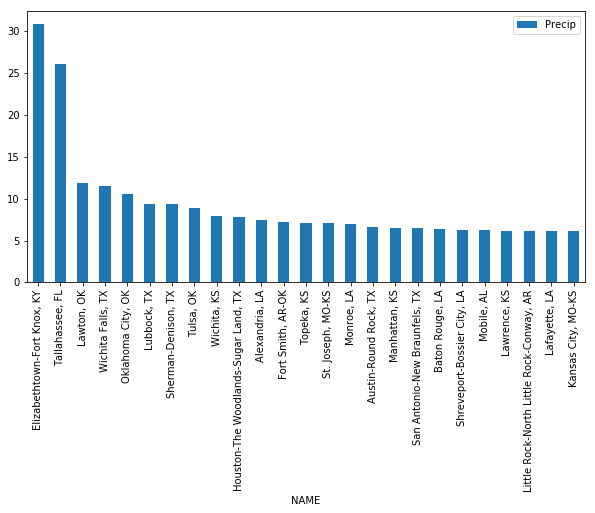

In [32]:
msa_mean_df = msa_df.groupby('NAME').agg({'Precip':'mean'})
msa_mean_df.sort_values('Precip',ascending=False).head(25).plot(kind='bar',figsize=(10,5))

## Add the population data
Create a DataFrame from the excel spreadsheet containing the MSA population data. Join that with our previous msa_mean DataFrame.  This will give us a Population field with which we can add our wetness column.  We then sort the new DataFrame by Wetness to yield our results.

In [33]:
#Load the excel file. Make sure we skip over the micropolitan entries.
pop = pd.read_excel(
    './data/CPH-T-5.xls', 
    usecols=[0,2],
    header=0,
    names=['MSA', 'Population'],
    skiprows=range(0,7),
    skip_footer=(955 - 389)
)

#join with our previous dataframe.
msa_pop = msa_mean_df.join(pop.set_index('MSA')).reset_index().set_index('NAME')

#Add the wetness column.
msa_pop['Wetness'] = msa_pop.apply(lambda row: row['Precip'] * row['Population'], axis=1)

#Display the results
msa_pop.sort_values('Wetness', ascending=False).head(25)

,Precip,Population,Wetness
NAME,,,
"Houston-The Woodlands-Sugar Land, TX",7.797000,5920416.0,4.616148e+07
"Dallas-Fort Worth-Arlington, TX",6.048261,6426214.0,3.886742e+07
"Chicago-Naperville-Elgin, IL-IN-WI",2.880714,9461105.0,2.725474e+07
"New York-Newark-Jersey City, NY-NJ-PA",1.191364,19567410.0,2.331190e+07
"Atlanta-Sandy Springs-Roswell, GA",3.648333,5286728.0,1.928775e+07
"San Antonio-New Braunfels, TX",6.498889,2142508.0,1.392392e+07
"Detroit-Warren-Dearborn, MI",3.134286,4296250.0,1.346567e+07
"Oklahoma City, OK",10.521250,1252987.0,1.318299e+07
"Kansas City, MO-KS",6.096000,2009342.0,1.224895e+07


In [31]:
import mplleaflet
fig = shape_df.plot(figsize=(20,20))
mplleaflet.display(fig=fig.figure)